In [4]:
x=1;
y=2;
println("hello world")
println(x+y)


hello world
3


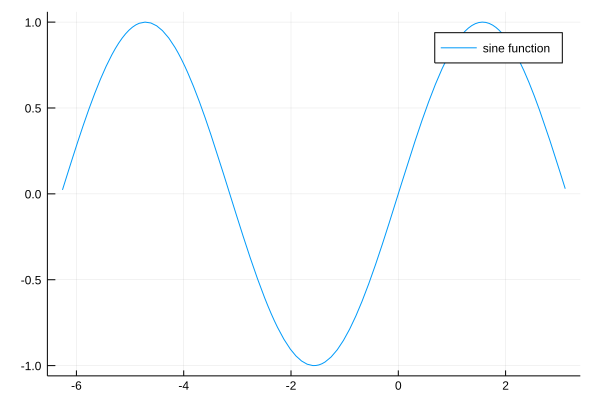

In [8]:
using Plots
plot(sin, -2pi, pi, label="sine function")


In [1]:
;ls

linear.ipynb
quantEco.ipynb


In [11]:
pwd()

"/home/alex/base/julia"

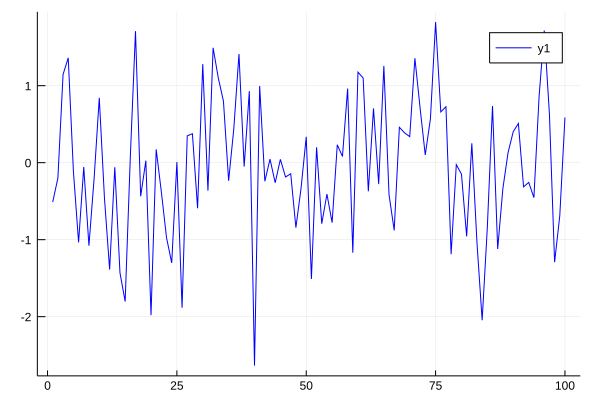

In [2]:
using Plots
ts_length = 100
ϵ_values = randn(ts_length)
plot(ϵ_values, color="blue")


In [3]:
typeof(ϵ_values)

Array{Float64,1}

In [4]:
x = [10, "foo", false]

3-element Array{Any,1}:
    10     
      "foo"
 false     

In [5]:
typeof(x[3])

Bool

In [6]:
pop!(x)

false

In [7]:
push!(x, "bar")

3-element Array{Any,1}:
 10     
   "foo"
   "bar"

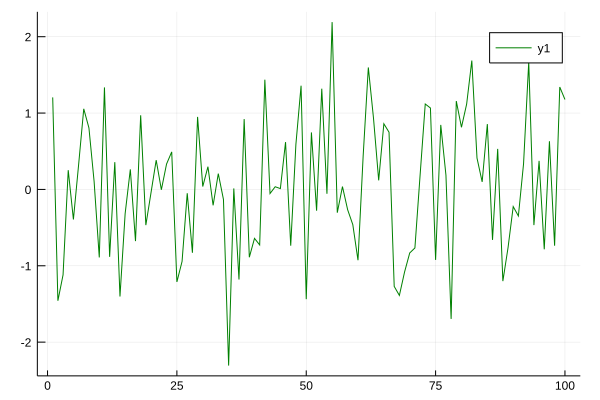

In [12]:
ts_length = 100
ϵ_values = Array{Float64}(undef,ts_length)
for i in 1:ts_length
    ϵ_values[i] = randn()
end
plot(ϵ_values, color="green")


In [15]:
m= Matrix{Float64}(undef,3,3)


3×3 Array{Float64,2}:
  50.0  -100.0  -250.0
   0.0  -150.0  -300.0
 -50.0  -200.0  -350.0

In [76]:
m=[1 2 3;4 5 6;7 8 9]
n = rot180(m)

3×3 Array{Int64,2}:
 9  8  7
 6  5  4
 3  2  1

In [73]:
A = [1 2; 3 4];
inv(A)


2×2 Array{Float64,2}:
 -2.0   1.0
  1.5  -0.5

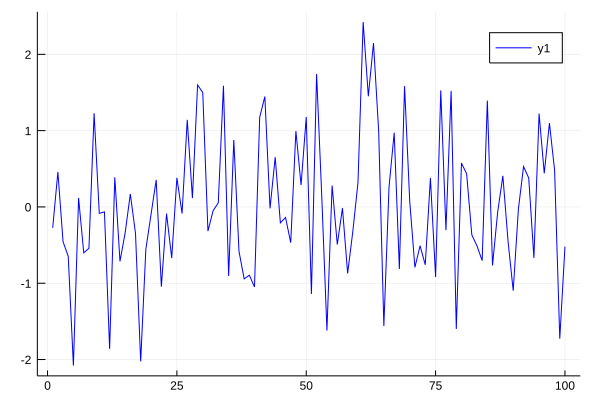

In [18]:
ts_length = 100
ϵ_values = Array{Float64}(undef,ts_length)
i = 1
while true
    ϵ_values[i] = randn()
    i = i + 1
    if i > ts_length
        break
    end
end
plot(ϵ_values, color="blue")

In [19]:
words = ["foo", "bar"]
for word in words
    println("Hello $word")
end

Hello foo
Hello bar


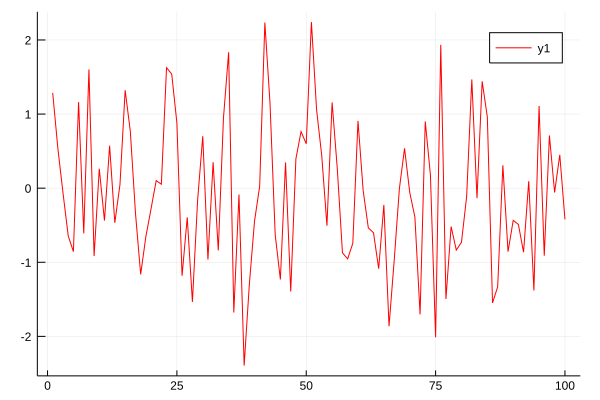

In [3]:
function generate_data(n)
    ϵ_values = Array{Float64}(undef,n)
    for i = 1:n
        ϵ_values[i] = randn()
    end
    return ϵ_values
end

ts_length = 100
data = generate_data(ts_length)
using Plots
plot(data, color="red")


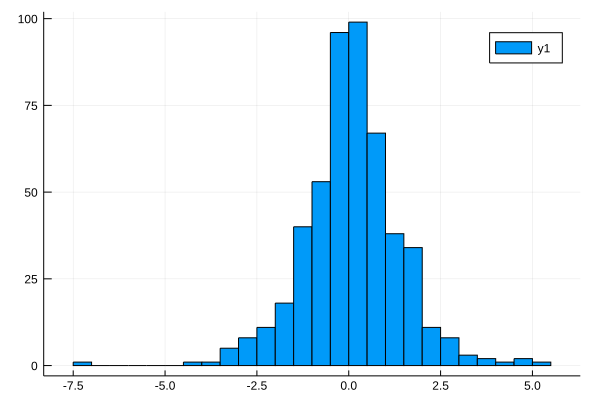

In [24]:
using Distributions

function plot_histogram(distribution, n)
    ϵ_values = rand(distribution, n)  # n draws from distribution; multiple dispatch
    histogram(ϵ_values)
end

lp = Laplace()
using PLots
plot_histogram(lp, 500)



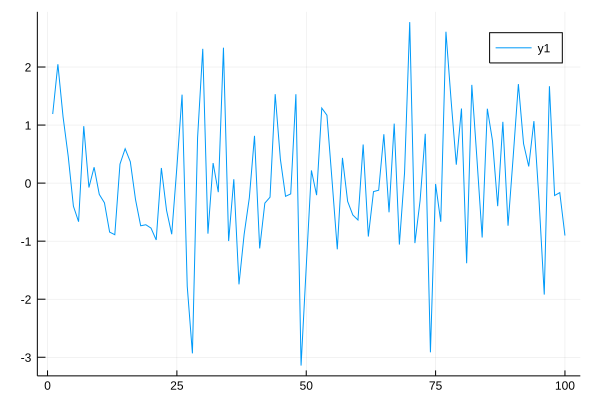

In [9]:
using Compat, Random, Distributions,Plots
Random.seed!(123) # Setting the seed

x = rand(Normal(), 100)
plot(x)

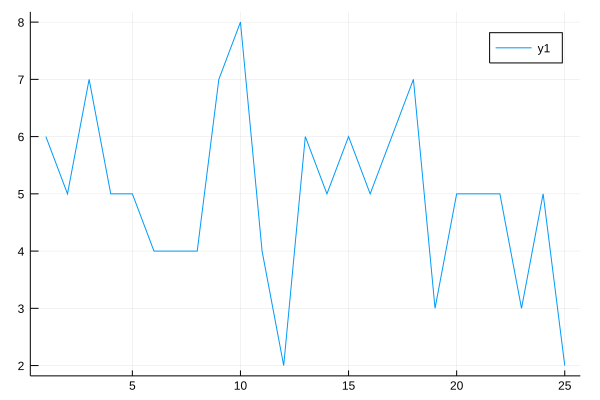

In [16]:
function binomial_rv(n, p)
    count = 0
    U = rand(n)
    for i in 1:n
        if U[i] < p
            count = count + 1    # Or count += 1
        end
    end
    return count
end

y=Array{Float64}(undef,25)

for j in 1:25
    y[j] = binomial_rv(10, 0.5)
    
end

using Plots
plot(y)

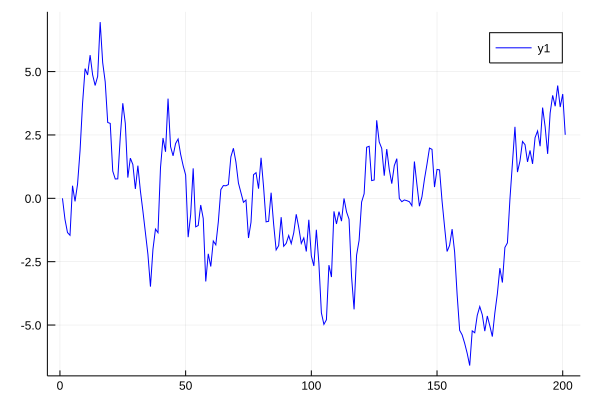

In [20]:
α = 0.9
T = 200
x = zeros(T + 1)

for t in 1:T
    x[t+1] = α * x[t] + randn()
end
plot(x, color="blue")

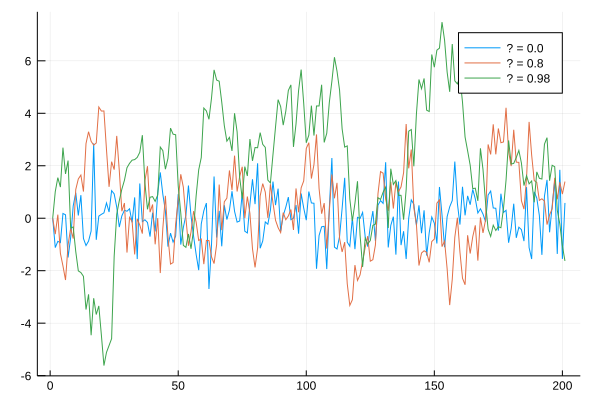

In [21]:
αs = [0.0, 0.8, 0.98]
T = 200

series = []
labels = []

for α in αs
    x = zeros(T + 1)
    x[1] = 0
    for t in 1:T
        x[t+1] = α * x[t] + randn()
    end
    push!(series, x)
    push!(labels, "α = $α")
end

plot(series, label=reshape(labels, 1, length(labels)))

In [22]:
nums = rand(3)
for num in nums
    println("Charlie get $num")
end


Charlie get 0.4693018708705954
Charlie get 0.5025231116888107
Charlie get 0.4571365473140132


In [47]:
@time sum([x % 2 == 0 for x in 0:99])


  0.061380 seconds (48.96 k allocations: 2.458 MiB)


50

In [44]:
data=map(x -> x % 2 == 0, 0:99)
sum(data)

50

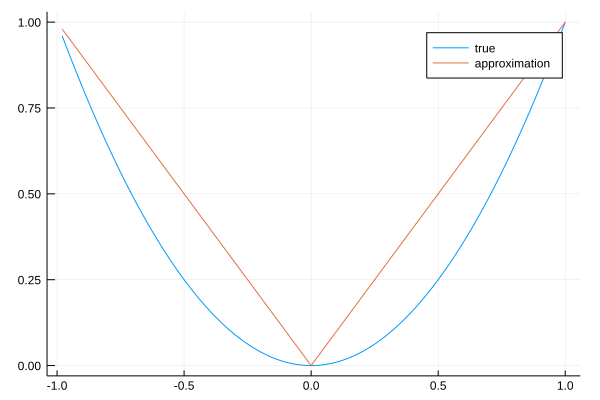

In [90]:
function linapprox(f, a, b, n, x)
    #=
    Evaluates the piecewise linear interpolant of f at x on the interval
    [a, b], with n evenly spaced grid points.

    =#
    length_of_interval = b - a
    num_subintervals = n - 1
    step = length_of_interval / num_subintervals

    # === find first grid point larger than x === #
    point = a
    while point <= x
        point += step
    end

    # === x must lie between the gridpoints (point - step) and point === #
    u, v = point - step, point

    return f(u) + (x - u) * (f(v) - f(u)) / (v - u)
end

f_ex5(x) = x^2
g_ex5(x) = linapprox(f_ex5, -1, 1, 3, x)

x_grid = [(2*x-100)/100 for x in 1:100]   #to emulate  linspace(-1, 1, 100)
y_vals = map(f_ex5, x_grid)
y_approx = map(g_ex5, x_grid)

using Plots

plot(x_grid, y_vals, label="true")
plot!(x_grid, y_approx, label="approximation")

In [87]:
Array{Int64, 1} == Vector{Int64}


true

In [88]:
Array{Int64, 2} == Matrix{Int64}

true

In [95]:
ones(5,5)


5×5 Array{Float64,2}:
 1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0

In [100]:
a=[1 2;3 4]
 a'
(a')'

2×2 Array{Int64,2}:
 1  2
 3  4

In [105]:
x, y = 1.0, 1.0
@which +(x, y)

+(x::Float64, y::Float64) in Base at float.jl:395

In [106]:
x, y = 1, 1
@which +(x, y)

+(x::T, y::T) where T<:Union{Int128, Int16, Int32, Int64, Int8, UInt128, UInt16, UInt32, UInt64, UInt8} in Base at int.jl:53

In [107]:
x, y = 1.0 + 1.0im, 1.0 + 1.0im
@which +(x, y)

+(z::Complex, w::Complex) in Base at complex.jl:266

In [108]:
methods(isfinite)

# 10 methods for generic function "isfinite":
[1] isfinite(x::BigFloat) in Base.MPFR at mpfr.jl:858
[2] isfinite(::Missing) in Base at missing.jl:79
[3] isfinite(x::Float16) in Base at float.jl:545
[4] isfinite(x::AbstractFloat) in Base at float.jl:544
[5] isfinite(x::Integer) in Base at float.jl:547
[6] isfinite(::AbstractIrrational) in Base at irrationals.jl:122
[7] isfinite(x::FixedPointNumbers.Normed) in FixedPointNumbers at /home/alex/.julia/packages/FixedPointNumbers/6yxhi/src/normed.jl:122
[8] isfinite(x::Real) in Base at float.jl:546
[9] isfinite(z::Complex) in Base at complex.jl:135
[10] isfinite(::Union{Type{T}, T}) where T<:Dates.TimeType in Dates at /buildworker/worker/package_linux64/build/usr/share/julia/stdlib/v1.0/Dates/src/types.jl:319

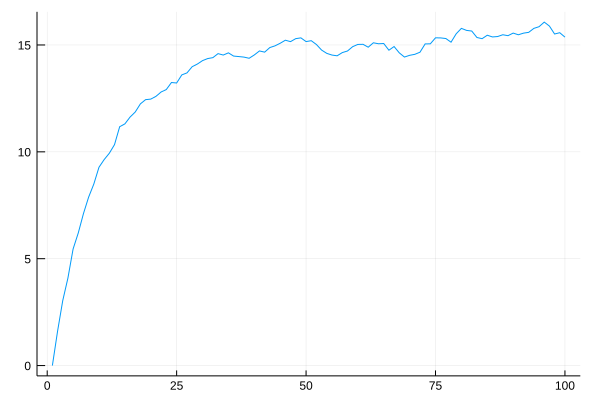

In [114]:
struct AR1_ex1{T <: Real}
    a::T
    b::T
    σ::T
    ϕ::Distribution
end

function simulate(m::AR1_ex1, n::Integer, x0::Real)
    X = Array{Float64}(undef,n)
    X[1] = x0
    for t in 1:(n-1)
        X[t+1] = m.a * X[t] + m.b + m.σ * rand(m.ϕ)
    end
    return X
end

m = AR1_ex1(0.9, 1.0, 1.0, Beta(5, 5))
X = simulate(m, 100, 0.0)
using Plots

plot(X, legend=:none)
